In [3]:
import numpy as np
import cv2
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import os
import pickle
import sys
from moviepy.editor import VideoFileClip
from IPython.display import HTML

# 1. Load Calibration and Test Images

In [4]:
f = open("../camera_cal/calibration.pkl", 'rb')
ret, mtx, dist, rvecs, tvecs = pickle.load(f)
f.close()

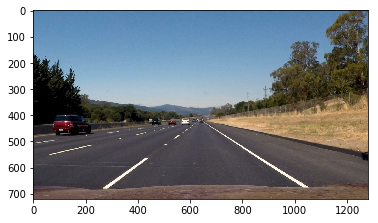

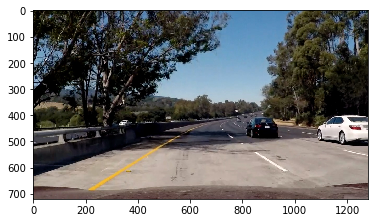

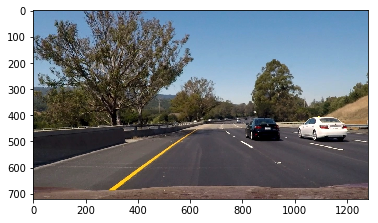

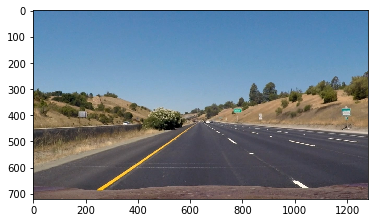

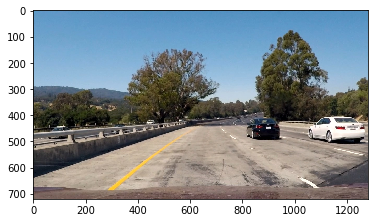

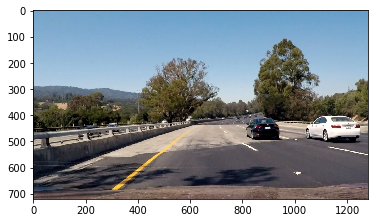

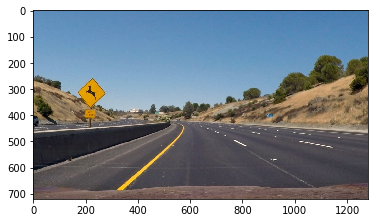

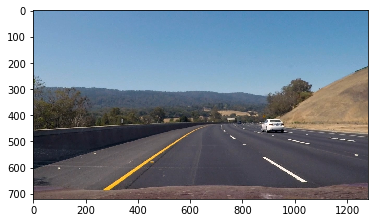

In [5]:
TEST_DIR = glob.glob("../test_images/*.jpg")
for img_link in TEST_DIR:
    img = cv2.cvtColor(cv2.imread(img_link), cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.show()

# 2. Correct for Camera Distortion

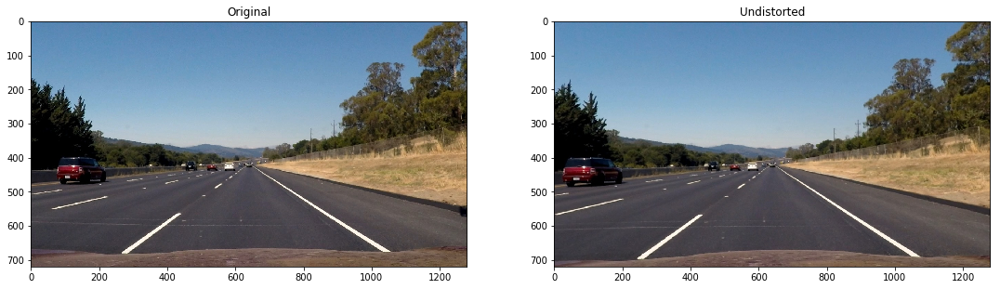

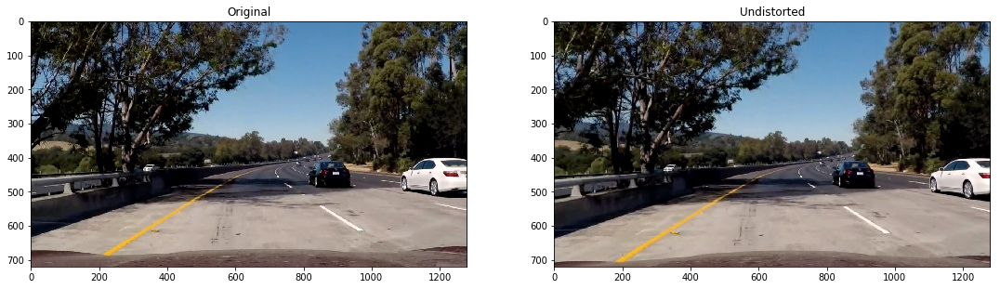

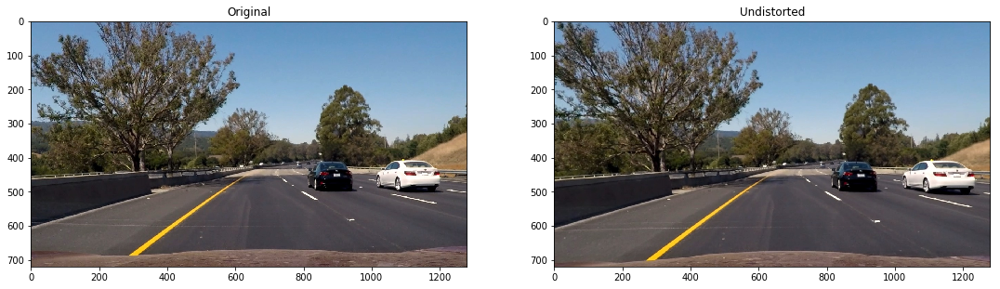

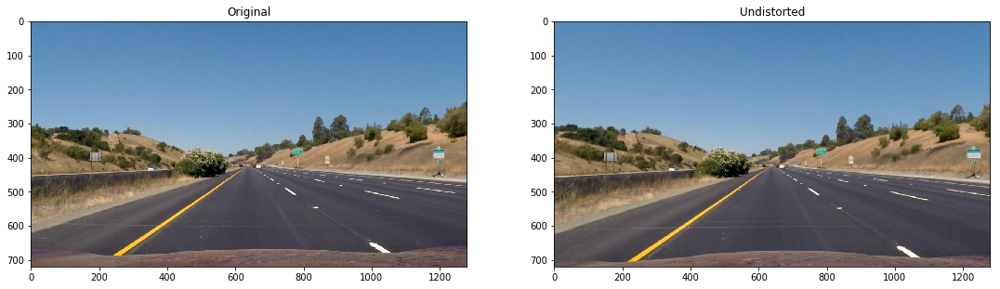

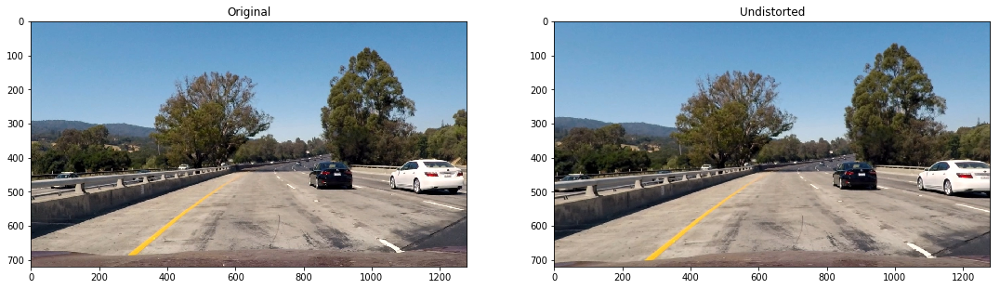

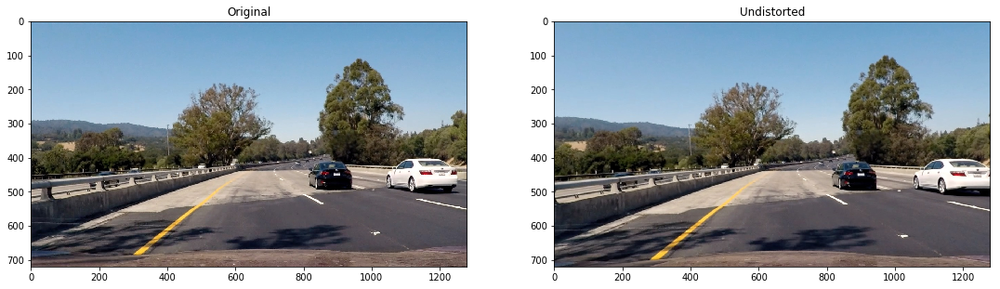

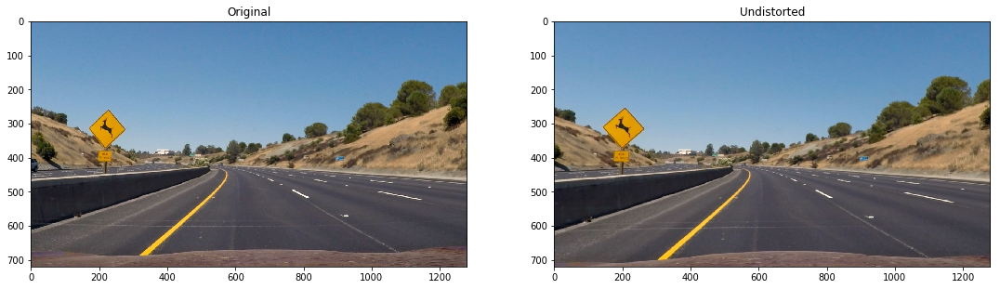

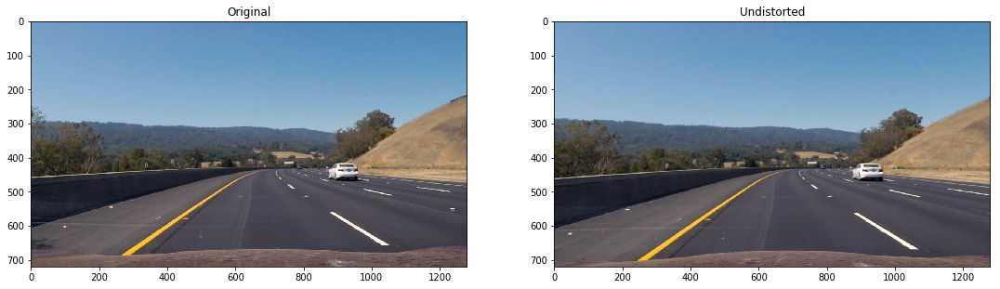

In [6]:
TEST_DIR = glob.glob("../test_images/*.jpg")
for img_link in TEST_DIR:
    f, axarr = plt.subplots(1, 2)
    img = cv2.cvtColor(cv2.imread(img_link), cv2.COLOR_BGR2RGB)
    
    axarr[0].imshow(img)
    axarr[0].set_title("Original")
    
    # undistort 
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    axarr[1].imshow(dst)
    axarr[1].set_title("Undistorted")
    f.set_size_inches(18.5, 10.5, forward=True)
    f.show()

# 3. Create a thresholded binary by filtering by a) gradient magnitude b) gradient direction c) 

In [7]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh_min=0, thresh_max=255):
    
   # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    # Return the result
    return binary_output

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    # Return the binary image
    return binary_output

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)): 
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_x = np.absolute(sobelx)
    abs_y = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    dir = np.arctan2(abs_y, abs_x)
    # 5) Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(dir)
    # 6) Return this mask as your binary_output image
    binary_output[(dir >= thresh[0]) & (dir <= thresh[1])] = 1    
    return binary_output

# Define a function that thresholds the S-channel of HLS
# Use exclusive lower bound (>) and inclusive upper (<=)
def hls_select(img, thresh=(0, 255)):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2]
    # 2) Apply a threshold to the S channel
    binary_output = np.zeros_like(S)
    # 3) Return a binary image of threshold result
    binary_output[(S > thresh[0]) & (S <= thresh[1])] = 1 # placeholder line
    return binary_output


def pipeline(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    return color_binary

def pipeline_binary(image):
     # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(image, orient='x', thresh_min=20, thresh_max=120)
    grady = abs_sobel_thresh(image, orient='y', thresh_min=20, thresh_max=120)
    mag_binary = mag_thresh(image, sobel_kernel=9, mag_thresh=(30, 100))
    dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.7, 1.3))
    hls_binary = hls_select(image, thresh=(90, 255))
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1)) | (hls_binary == 1)] = 1
    combined[((mag_binary == 1) & (dir_binary == 1))] = 1
    return combined

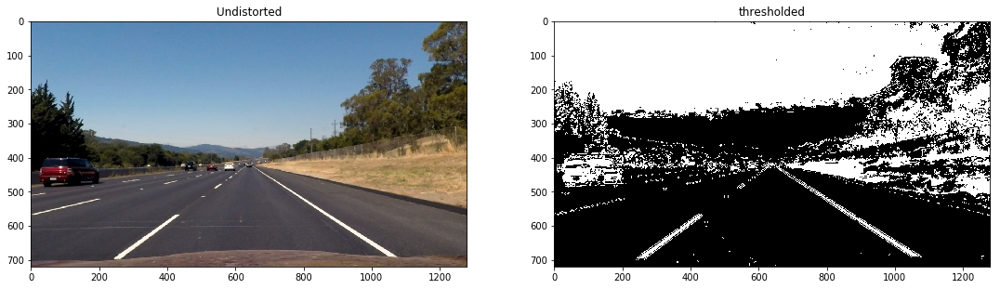

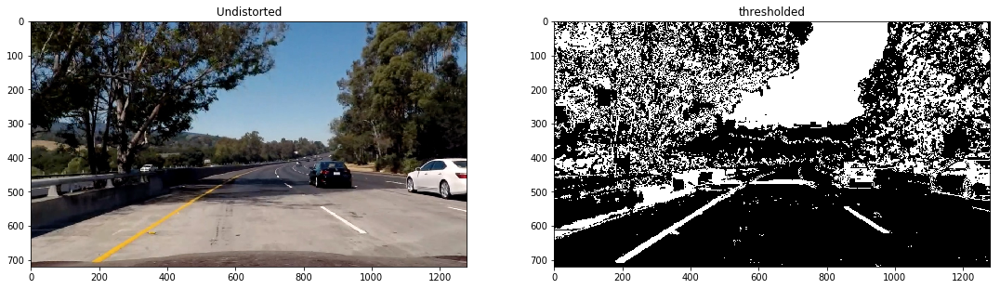

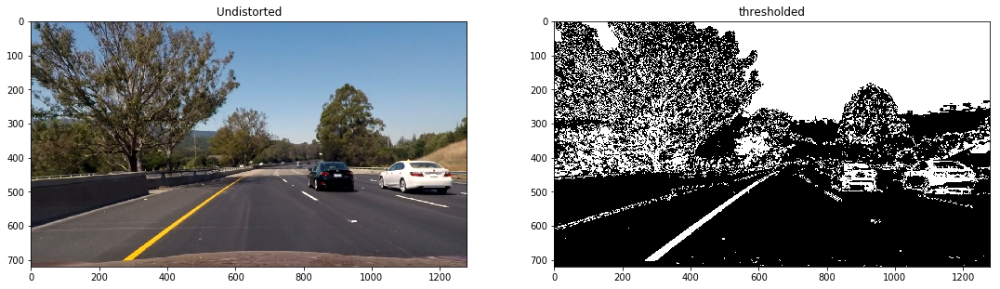

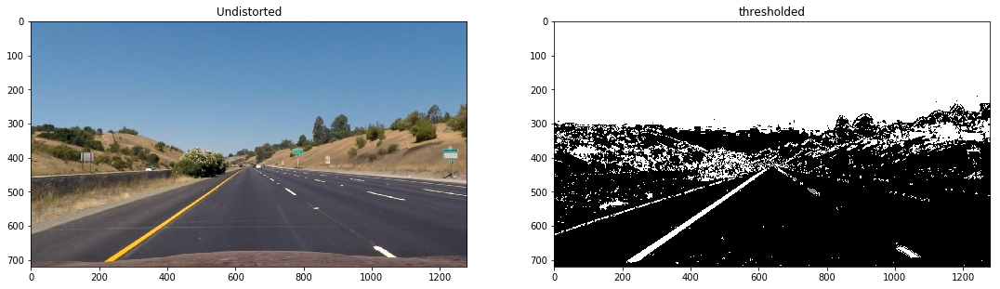

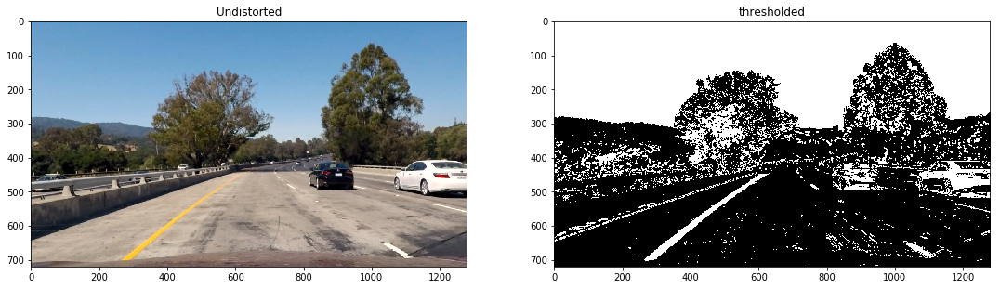

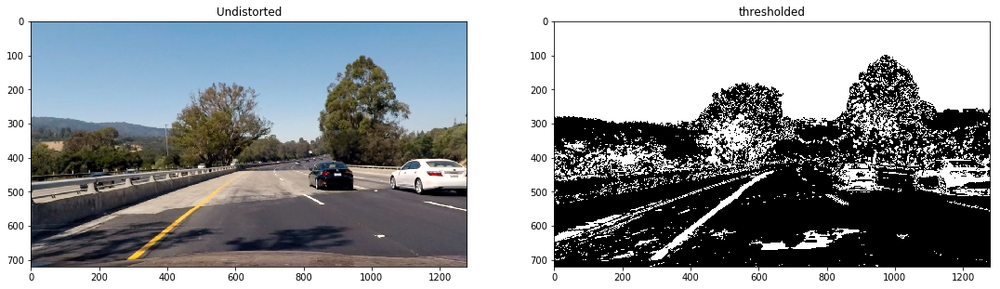

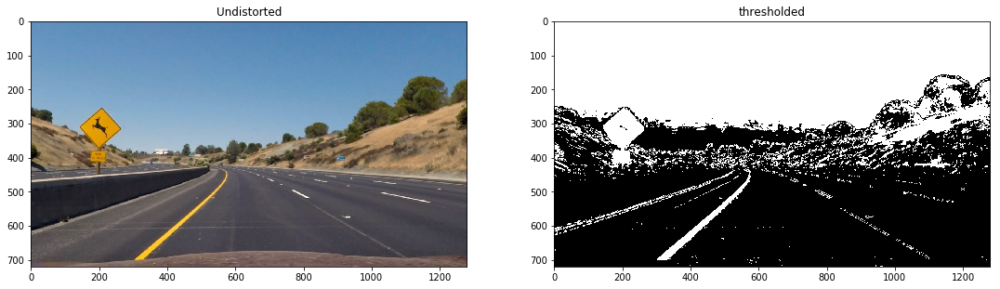

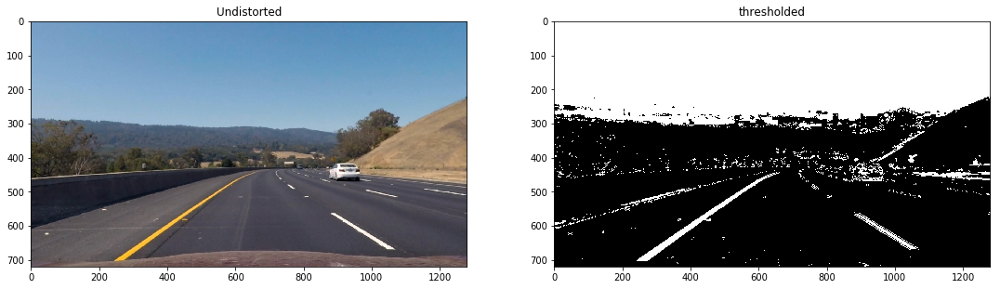

In [8]:
TEST_DIR = glob.glob("../test_images/*.jpg")
for img_link in TEST_DIR:
    f, axarr = plt.subplots(1, 2)
    img = cv2.cvtColor(cv2.imread(img_link), cv2.COLOR_BGR2RGB)
    
    # undistort 
    image = cv2.undistort(img, mtx, dist, None, mtx)
    axarr[0].imshow(image)
    axarr[0].set_title("Undistorted")
    

    # Apply each of the thresholding functions
    threshed = pipeline_binary(image)
    axarr[1].imshow(threshed, cmap='gray')
    axarr[1].set_title("thresholded")
    
    f.set_size_inches(18.5, 10.5, forward=True)
    f.show()

# Helper Functions

In [9]:
import math

def grayscale(img):
    """Applies the Grayscale transform
    This will return an image with only one color channel
    but NOTE: to see the returned image as grayscale
    (assuming your grayscaled image is called 'gray')
    you should call plt.imshow(gray, cmap='gray')"""
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Or use BGR2GRAY if you read an image with cv2.imread()
    # return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
def canny(img, low_threshold, high_threshold):
    """Applies the Canny transform"""
    return cv2.Canny(img, low_threshold, high_threshold)

def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    `vertices` should be a numpy array of integer points.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)

    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def my_decorator(func):
    def wrapper(*args, **kwargs):
        if len(wrapper.cached_lines) < wrapper.cache_size:
            wrapper.cached_lines.extend(args[1])
        else:
            wrapper.cached_lines = wrapper.cached_lines[len(args[1])::]
            wrapper.cached_lines.extend(args[1])
        return func(img=args[0], lines=wrapper.cached_lines, **kwargs)
    wrapper.cached_lines = []
    wrapper.cache_size = 300
    return wrapper

@my_decorator
def draw_lines(image, lines, color=[255, 0, 0], thickness=7):
    """
    NOTE: this is the function you might want to use as a starting point once you want to 
    average/extrapolate the line segments you detect to map out the full
    extent of the lane (going from the result shown in raw-lines-example.mp4
    to that shown in P1_example.mp4).  
    
    Think about things like separating line segments by their 
    slope ((y2-y1)/(x2-x1)) to decide which segments are part of the left
    line vs. the right line.  Then, you can average the position of each of 
    the lines and extrapolate to the top and bottom of the lane.
    
    This function draws `lines` with `color` and `thickness`.    
    Lines are drawn on the image inplace (mutates the image).
    If you want to make the lines semi-transparent, think about combining
    this function with the weighted_img() function below
    """
    
    left_x, left_y, right_x, right_y = [], [], [], []
    start_left = [0, image.shape[0]] #looking for smallest y coord, and largest x-coorest smaller than image.shape[1] /2
    start_right = [image.shape[1], image.shape[0]] # looking for smallest y coord, and largest x-coord
    for line in lines:
        for x1,y1,x2,y2 in line:
            tmp_slope = ((y2 - y1) / (x2 - x1))
            if -0.9 <= tmp_slope <= -0.3:
                left_x.append(x1)
                left_x.append(x2)
                left_y.append(y1)
                left_y.append(y2)
                if x1 > start_left[0] and y1 < start_left[1] and x1 < image.shape[1] / 2:
                    start_left[0], start_left[1] = x1, y1
                elif x2 > start_left[0] and y2 < start_left[1] and x2 < image.shape[1] / 2:
                    start_left[0], start_left[1] = x2, y2
            elif 0.3 <= tmp_slope <= 0.9:
                right_x.append(x1)
                right_x.append(x2)
                right_y.append(y1)
                right_y.append(y2)
                if x1 < start_right[0] and y1 < start_right[1] and x1 > image.shape[1] / 2 :
                    start_right[0], start_right[1] = x1, y1
                elif x2 < start_left[0] and y2 < start_left[1] and x2 > image.shape[1] / 2:
                    start_right[0], start_right[1] = x2, y2
     
    if left_x and right_x:
        # y = ax + b     (y - b) / a = x
        left_fit = np.polyfit(left_x, left_y, 1)
        right_fit = np.polyfit(right_x, right_y, 1)

        # draw start coordinates
#         left_top = (start_left[0], start_left[1])
#         right_top = (start_right[0], start_right[1])

        # Need to find left_top and right_top. Y-coordinate is the same, but x is different

        left_bot_x = int((image.shape[0] - left_fit[1]) / left_fit[0])
        right_bot_x = int((image.shape[0] - right_fit[1]) / right_fit[0])

        left_bot = (left_bot_x, image.shape[0])
        right_bot = (right_bot_x, image.shape[0])

        cv2.line(img, left_bot, left_top, color, thickness)
        cv2.line(img, right_top, right_bot, color, thickness)

        
def drawBirdsEye(image, lines, color=[255, 0, 0], thickness=7):
    """
    NOTE: this is the function you might want to use as a starting point once you want to 
    average/extrapolate the line segments you detect to map out the full
    extent of the lane (going from the result shown in raw-lines-example.mp4
    to that shown in P1_example.mp4).  
    
    Think about things like separating line segments by their 
    slope ((y2-y1)/(x2-x1)) to decide which segments are part of the left
    line vs. the right line.  Then, you can average the position of each of 
    the lines and extrapolate to the top and bottom of the lane.
    
    This function draws `lines` with `color` and `thickness`.    
    Lines are drawn on the image inplace (mutates the image).
    If you want to make the lines semi-transparent, think about combining
    this function with the weighted_img() function below
    """
    
    left_x, left_y, right_x, right_y = [], [], [], []
    start_left = [0, image.shape[0]] #looking for smallest y coord, and largest x-coorest smaller than image.shape[1] /2
    start_right = [image.shape[1], image.shape[0]] # looking for smallest y coord, and largest x-coord
    for line in lines:
        for x1,y1,x2,y2 in line:
            tmp_slope = ((y2 - y1) / (x2 - x1))
            if -0.9 <= tmp_slope <= -0.3:
                left_x.append(x1)
                left_x.append(x2)
                left_y.append(y1)
                left_y.append(y2)
                if x1 > start_left[0] and y1 < start_left[1] and x1 < image.shape[1] / 2:
                    start_left[0], start_left[1] = x1, y1
                elif x2 > start_left[0] and y2 < start_left[1] and x2 < image.shape[1] / 2:
                    start_left[0], start_left[1] = x2, y2
            elif 0.3 <= tmp_slope <= 0.9:
                right_x.append(x1)
                right_x.append(x2)
                right_y.append(y1)
                right_y.append(y2)
                if x1 < start_right[0] and y1 < start_right[1] and x1 > image.shape[1] / 2 :
                    start_right[0], start_right[1] = x1, y1
                elif x2 < start_left[0] and y2 < start_left[1] and x2 > image.shape[1] / 2:
                    start_right[0], start_right[1] = x2, y2
     
    if left_x and right_x:
        left_fit = np.polyfit(left_x, left_y, 1)
        right_fit = np.polyfit(right_x, right_y, 1)

        # draw start coordinates
        # y = ax + b => (y - b) // a = x
        min_y = min(start_left[1], start_right[1])
        
        left_top_x = int((min_y - left_fit[1]) / left_fit[0])
        right_top_x = int((min_y - right_fit[1]) / right_fit[0])
        
        left_top = (left_top_x, min_y)
        right_top = (right_top_x, min_y)
        

        left_bot_x = int((image.shape[0] - left_fit[1]) / left_fit[0])
        right_bot_x = int((image.shape[0] - right_fit[1]) / right_fit[0])

        left_bot = (left_bot_x, image.shape[0])
        right_bot = (right_bot_x, image.shape[0])

        # Draw Red Dots on each of the center
        return [left_bot, left_top, right_bot, right_top]

    
def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap, birdsEye=False):
    """
    `img` should be the output of a Canny transform.
        
    Returns an image with hough lines drawn.
    """
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    if lines is not None and len(lines) > 0:
        if birdsEye:
            return drawBirdsEye(line_img, lines)
        else:
            draw_lines(line_img, lines)
            return line_img


# Python 3 has support for cool math symbols.
def weighted_img(img, initial_img, α=0.8, β=1., γ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows: 
    
    initial_img * α + img * β + γ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, γ)

def process_image(image):
    """
    Returns an image with lane lines drawn in
    """
    gray = grayscale(image)
    
    #define a kernel size and apply Gaussian smoothing
    blur_gray = gaussian_blur(image, kernel_size=5)
    
    # Define parameters for Canny and Apply
    val_median = np.median(image)
    std = 0.33
    low_thresh =  int(max(0, (1.0 - std) * val_median))
    high_thresh = int(min(255, (1.0 + std) * val_median))
    edges = canny(image, low_thresh, high_thresh)
    
    ## create a masked region of interest
    vertices = np.array([[(image.shape[1] * 0.1, image.shape[0]), (image.shape[1] * 0.4, image.shape[0] * 0.6), (image.shape[1] * 0.6, image.shape[0] * 0.6), (image.shape[1] * 0.9, image.shape[0])]], dtype=np.int32) 
    masked_edges = region_of_interest(edges, vertices)

    
    #Define the Hough Transform parameters
    image_hough = hough_lines(masked_edges, rho=1, theta=np.pi/180, 
                              threshold=3, min_line_len=60, max_line_gap=15)

    # Create a "color" binary image to combine with line image
    overlayed = weighted_img(image, image_hough, 0.6, 0.4)
    return overlayed

# 4. Perspective Transform

In [10]:
class NoLinesDetectedError(Exception):
    pass

def getStaticTransformationMatrix(image):
    img_size =  (image.shape[1], image.shape[0])
    src = np.float32([[((img_size[0] / 6) - 10), img_size[1]], 
    [(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
    [(img_size[0] * 5 / 6) + 60, img_size[1]],
    [(img_size[0] / 2 + 55), img_size[1] / 2 + 100]])

    dst = np.float32([[(img_size[0] / 4), img_size[1]],
    [(img_size[0] / 4), 0],
    [(img_size[0] * 3 / 4), img_size[1]],
    [(img_size[0] * 3 / 4), 0]])
    
    M = cv2.getPerspectiveTransform(src , dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    return M, Minv

    
def getTransformationMatrix(image, threshed=True):
    # Define parameters for Canny and Apply
    edges = None
    if threshed == True:
        edges = canny(image, 0, 1)
        image = (np.dstack((image, image, image)) * 255).astype(np.uint8)
    else:
        val_median = np.median(image)
        std = 0.33
        low_thresh =  int(max(0, (1.0 - std) * val_median))
        high_thresh = int(min(255, (1.0 + std) * val_median))
        edges = canny(image, low_thresh, high_thresh)
    
    ## create a masked region of interest
    vertices = np.array([[(image.shape[1] * 0.1, image.shape[0]), (image.shape[1] * 0.4, image.shape[0] * 0.6), (image.shape[1] * 0.6, image.shape[0] * 0.6), (image.shape[1] * 0.9, image.shape[0])]], dtype=np.int32) 
    masked_edges = region_of_interest(edges, vertices)

    # Hough lines for Bird
    res = hough_lines(masked_edges, rho=1, theta=np.pi/180, 
                              threshold=3, min_line_len=60, max_line_gap=7, birdsEye=True)
    
    
    if res is not None:
        left_bot, left_top, right_bot, right_top = res
        
        originalImage, birdsEyeImage = image.copy(), image.copy()
        originalPoints = np.array([[left_bot, left_top, right_bot, right_top]], dtype='float32')
        color = [255, 0, 0]
        thickness = 3
        offset = 150
        img_size =  (originalImage.shape[1], originalImage.shape[0])

        ''' 
        src = np.float32([left_bot, left_top, right_bot, right_top])
#         dst = np.float32([[offset, img_size[1] + offset], [offset, -offset],
#                               [img_size[0]- offset, img_size[1] + offset],
#                              [img_size[0]-offset, -offset]])
#         dst = np.float32([[offset, img_size[1] - offset], [offset, + offset],
#                               [img_size[0]- offset, img_size[1] - offset],
#                              [img_size[0]-offset, offset]])
        dst = np.float32([[offset, img_size[1]], [offset,  0],
                              [img_size[0] - offset, img_size[1]],
                             [img_size[0] - offset, 0]])
        '''
        src = np.float32(
        [  [((img_size[0] / 6) - 10), img_size[1]],
         [(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
        [(img_size[0] * 5 / 6) + 60, img_size[1]],
        [(img_size[0] / 2 + 55), img_size[1] / 2 + 100]])
        
        dst = np.float32(
        [  [(img_size[0] / 4), img_size[1]],
         [(img_size[0] / 4), 0],
        [(img_size[0] * 3 / 4), img_size[1]],
        [(img_size[0] * 3 / 4), 0]])
    
        M = cv2.getPerspectiveTransform(src , dst)
        Minv = cv2.getPerspectiveTransform(dst, src)
        return (M, Minv), (src, dst)
    else:
        raise NoLinesDetectedError
    

def birdEyesTransform(image, threshed=True):
    """
    Given an img, apply a "bird's eye perspective transform ino the given vertices"    
    """
    # Define parameters for Canny and Apply
    edges = None
    if threshed == True:
        edges = canny(image, 0, 1)
        image = (np.dstack((image, image, image)) * 255).astype(np.uint8)
    else:
        val_median = np.median(image)
        std = 0.33
        low_thresh =  int(max(0, (1.0 - std) * val_median))
        high_thresh = int(min(255, (1.0 + std) * val_median))
        edges = canny(image, low_thresh, high_thresh)
    
    ## create a masked region of interest
    vertices = np.array([[(image.shape[1] * 0.1, image.shape[0]), (image.shape[1] * 0.4, image.shape[0] * 0.6), (image.shape[1] * 0.6, image.shape[0] * 0.6), (image.shape[1] * 0.9, image.shape[0])]], dtype=np.int32) 
    masked_edges = region_of_interest(edges, vertices)

    # Hough lines for Bird
    res = hough_lines(masked_edges, rho=1, theta=np.pi/180, 
                              threshold=3, min_line_len=60, max_line_gap=7, birdsEye=True)
    
    
    if res is not None:
        left_bot, left_top, right_bot, right_top = res
        
        originalImage, birdsEyeImage = image.copy(), image.copy()
        originalPoints = np.array([[left_bot, left_top, right_bot, right_top]], dtype='float32')
        color = [255, 0, 0]
        thickness = 3
        offset = 150
        img_size =  (originalImage.shape[1], originalImage.shape[0])

        
        src = np.float32([left_bot, left_top, right_bot, right_top])
        dst = np.float32([[offset, img_size[1] + offset], [offset, -offset],
                              [img_size[0]- offset, img_size[1] + offset],
                             [img_size[0]-offset, -offset]])
        M = cv2.getPerspectiveTransform(src , dst)
        Minv = cv2.getPerspectiveTransform(dst, src)
        
        birdsEyeImage = cv2.warpPerspective(originalImage, M, img_size)
        birdsEyePoints = cv2.perspectiveTransform(originalPoints, M)

        return (originalImage, originalPoints), (birdsEyeImage, birdsEyePoints), (M, Minv)
    else:
        raise NoLinesDetectedError

# 3. Apply a Perspective Transform for Bird's eye view.


M.shape: (3, 3), srcPoints.shape: (4, 2), dstPoints: (4, 2)
M.shape: (3, 3), srcPoints.shape: (4, 2), dstPoints: (4, 2)
M.shape: (3, 3), srcPoints.shape: (4, 2), dstPoints: (4, 2)
M.shape: (3, 3), srcPoints.shape: (4, 2), dstPoints: (4, 2)
M.shape: (3, 3), srcPoints.shape: (4, 2), dstPoints: (4, 2)
M.shape: (3, 3), srcPoints.shape: (4, 2), dstPoints: (4, 2)
M.shape: (3, 3), srcPoints.shape: (4, 2), dstPoints: (4, 2)
M.shape: (3, 3), srcPoints.shape: (4, 2), dstPoints: (4, 2)


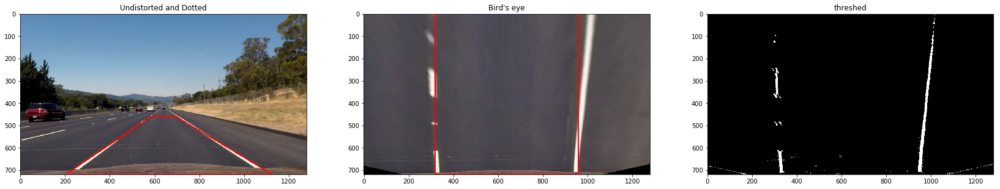

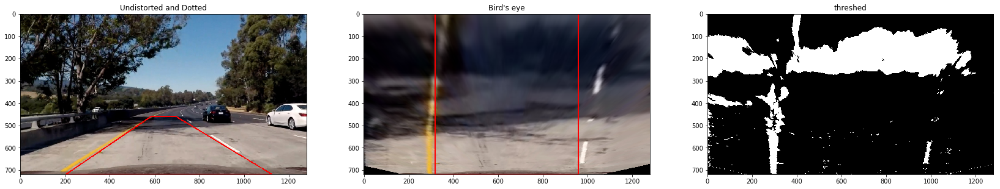

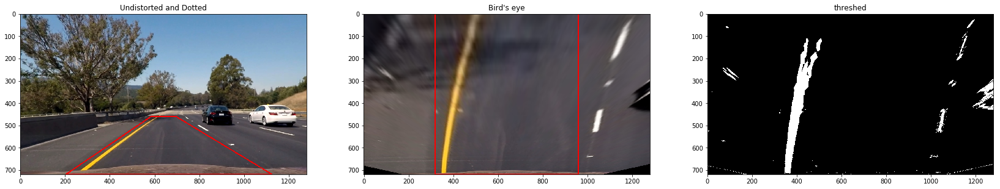

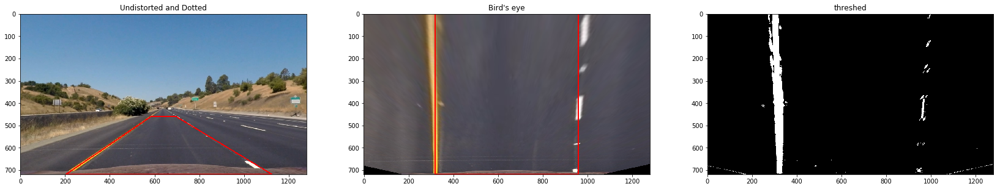

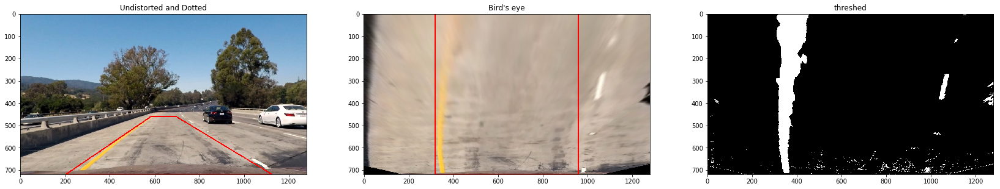

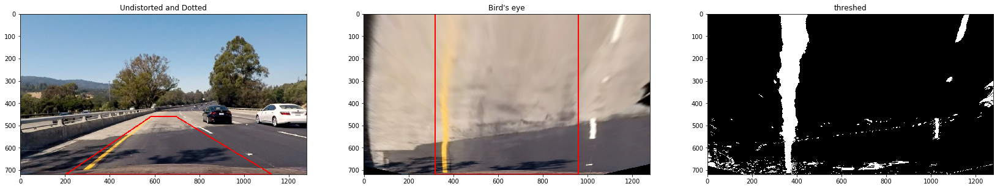

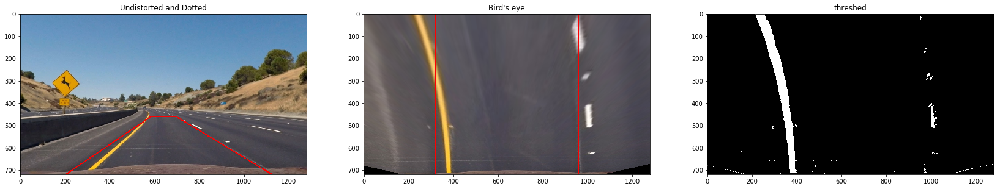

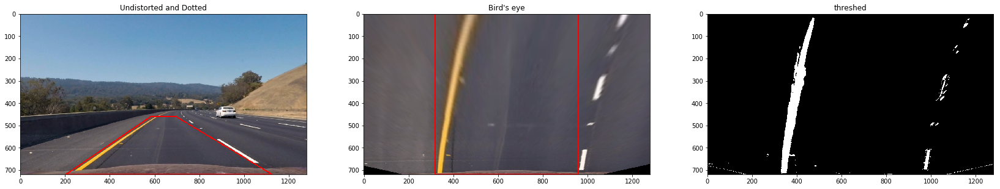

In [11]:
TEST_DIR = glob.glob("../test_images/*.jpg")
BINARY_DIR = "../binary_output/"
if not os.path.exists(BINARY_DIR):
    os.makedirs(BINARY_DIR)
i = 0
for img_link in TEST_DIR:
    img = cv2.cvtColor(cv2.imread(img_link), cv2.COLOR_BGR2RGB)
    img = cv2.undistort(img, mtx, dist, None, mtx)
    threshed = pipeline_binary(img).astype(np.uint8)
    
    # get the transformation matrix
    try:
        (M, Minv), (srcPoints, dstPoints)  = getTransformationMatrix(img)
    except NoLinesDetectedError:
        continue
    
    # Transform from the original image to birds eyeview
    print('M.shape: {}, srcPoints.shape: {}, dstPoints: {}'.format(M.shape, srcPoints.shape, dstPoints.shape))
    img_size = (img.shape[1], img.shape[0])
    birdsEyeView = cv2.warpPerspective(img, M, img_size)
    birdsEyePoints = cv2.perspectiveTransform(np.array([srcPoints]), M)

    f, axarr = plt.subplots(1, 3)
    color=[255, 0, 0]
    thickness=3
    cv2.line(img, tuple(srcPoints[0]), tuple(srcPoints[1]), color, thickness=thickness)
    cv2.line(img, tuple(srcPoints[1]), tuple(srcPoints[3]), color, thickness=thickness)
    cv2.line(img, tuple(srcPoints[2]), tuple(srcPoints[3]), color, thickness=thickness)
    cv2.line(img, tuple(srcPoints[2]), tuple(srcPoints[0]), color, thickness=thickness)
    axarr[0].imshow(img, cmap='gray')
    axarr[0].set_title("Undistorted and Dotted")

    # undistort
    bePoints = birdsEyePoints[0][:, :2]
    birdsEyeView2 = birdsEyeView.copy()

    cv2.line(birdsEyeView, tuple(bePoints[0]), tuple(bePoints[1]), color, thickness=thickness)
    cv2.line(birdsEyeView, tuple(bePoints[1]), tuple(bePoints[3]), color, thickness=thickness)
    cv2.line(birdsEyeView, tuple(bePoints[2]), tuple(bePoints[3]), color, thickness=thickness)
    cv2.line(birdsEyeView, tuple(bePoints[2]), tuple(bePoints[0]), color, thickness=thickness)
    axarr[1].imshow(birdsEyeView, cmap='gray')
    axarr[1].set_title("Bird's eye")


    birdsEyeThreshed = pipeline_binary(birdsEyeView2)
    axarr[2].imshow(birdsEyeThreshed, cmap='gray')
    axarr[2].set_title('threshed')
    path = BINARY_DIR + str(i) + '.png'
    cv2.imwrite(path, birdsEyeThreshed.astype('uint8') * 255)
    i += 1

    f.set_size_inches(28.5, 20.5, forward=True)

# 4. Detect Lane Pixels and fit to find lane boundary

In [36]:
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 30

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img



def measure_curvature_real(ploty, left_fit_cr, right_fit_cr, xm_per_pix, ym_per_pix):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''

    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    ##### TO-DO: Implement the calculation of R_curve (radius of curvature) #####
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    return left_curverad, right_curverad
def search_around_poly_with_curvature(binary_warped, left_fit, right_fit, per_pix_config=[30/700, 3.7/1200]):
    """
    When passed in left_fit, right_fit, this function
    """
    # HYPERPARAMETER
    res = {}
    margin = 100
    img_shape = [binary_warped.shape[1], binary_warped.shape[0]]

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    xm_per_pix = 3.7 / np.abs(leftx[0] - rightx[0])
    NUM_DASHED_LINES = 4
    ym_per_pix = (NUM_DASHED_LINES * 3) / img_shape[1]

    # Fit new polynomials
    left_fit_cr = np.polyfit(lefty * ym_per_pix, leftx * xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty * ym_per_pix, rightx * xm_per_pix, 2)
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)


    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1 * 2, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        res['detected'] = True
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a  line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty
        res['detected'] = False
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    # get the curvature
    left_curverad, right_curverad = measure_curvature_real(ploty, left_fit_cr, right_fit_cr, xm_per_pix, ym_per_pix)    

    res['left_fitx'] = left_fitx
    res['right_fitx'] = right_fitx
    res['ploty'] = ploty
    res['left_fit'] = left_fit
    res['right_fit'] = right_fit
    res['leftx'] = leftx
    res['rightx'] = rightx
    res['lefty'] = lefty
    res['righty'] = righty
    res['left_curverad'] = left_curverad
    res['right_curverad'] = right_curverad
    res['out_img'] = out_img
    return res



def fit_polynomial_with_curvature(binary_warped, per_pix_config=[30/700, 3.7/1200]):
    res = {}
    img_shape = [binary_warped.shape[1], binary_warped.shape[0]]

    # Find our lane pixels first using sliding window
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
    xm_per_pix = 3.7 / np.abs(leftx[0] - rightx[0])
    NUM_DASHED_LINES = 4
    ym_per_pix = (NUM_DASHED_LINES * 3) / img_shape[1]

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit_cr = np.polyfit(lefty * ym_per_pix, leftx * xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty * ym_per_pix, rightx * xm_per_pix, 2)
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1 * 2, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        res['detected'] = True
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a  line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty
        res['detected'] = False

    # Adverage radius of curvature
    left_curverad, right_curverad = measure_curvature_real(ploty, left_fit_cr, right_fit_cr, xm_per_pix, ym_per_pix)    
        
    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]
    
#     plt.plot(left_fitx, ploty, color='yellow')
#     plt.plot(right_fitx, ploty, color='yellow')


    res['left_fitx'] = left_fitx
    res['right_fitx'] = right_fitx
    res['ploty'] = ploty
    res['left_curverad'] = left_curverad
    res['right_curverad'] = right_curverad
    res['left_fit'] = left_fit
    res['right_fit'] = right_fit
    res['leftx'] = leftx
    res['rightx'] = rightx
    res['lefty'] = lefty
    res['righty'] = righty
    res['out_img'] = out_img

    return res


binary warped binary (720, 1280) uint8


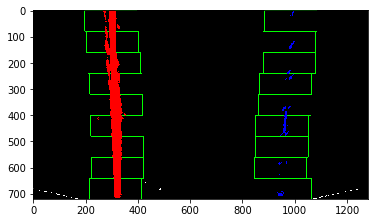

binary warped binary (720, 1280) uint8


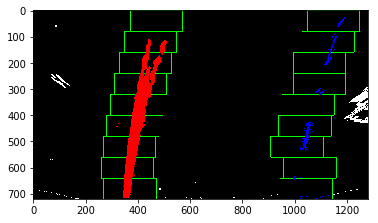

binary warped binary (720, 1280) uint8


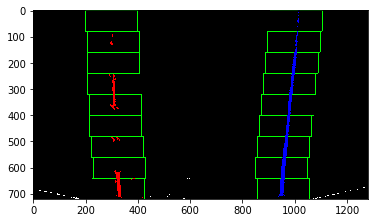

binary warped binary (720, 1280) uint8


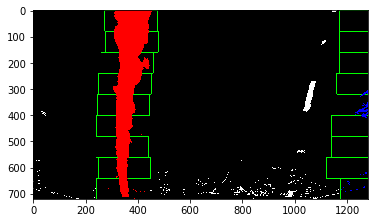

binary warped binary (720, 1280) uint8


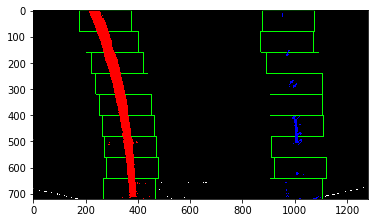

binary warped binary (720, 1280) uint8


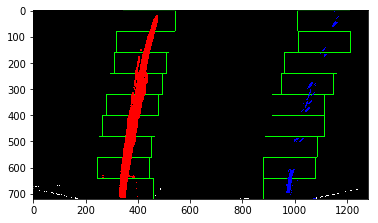

binary warped binary (720, 1280) uint8


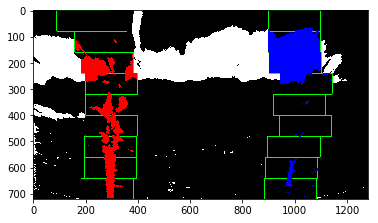

binary warped binary (720, 1280) uint8


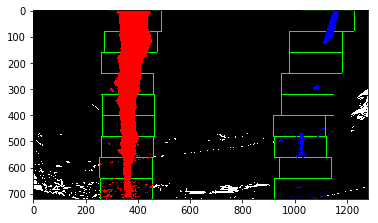

In [37]:
BINARY_DIR = glob.glob("../binary_output/*.png")
for img_link in BINARY_DIR:
    binary_warped = cv2.cvtColor(cv2.imread(img_link), cv2.COLOR_BGR2GRAY)
    print('binary warped binary', binary_warped.shape, binary_warped.dtype)

    res = fit_polynomial_with_curvature(binary_warped)     
    plt.imshow(res['out_img'])
    plt.show()

# 5. Entirely Pipeline on Test Images


In [38]:
import copy

def full_pipeline(img, M=None, MinV=None):
    
    """
    Returns the output from an image after running the cv pipeline
    """
    #open calibration
    f = open("../camera_cal/calibration.pkl", 'rb')
    ret, mtx, dist, rvecs, tvecs = pickle.load(f)
    f.close()
    

    # Correct for Camera Distortion
    img = cv2.undistort(img, mtx, dist, None, mtx)
    
    # get the transformation matrix
    try:
        if M is None or Minv is None:
            M, Minv = getStaticTransformationMatrix(img)
    except NoLinesDetectedError:
        return img
         
    # Transform from original image to birdseEyeView
    img_size = (img.shape[1], img.shape[0])
    birdsEyeView = cv2.warpPerspective(img, M, img_size)
    
    # Turn birdsEyeView into binary thresholded
    birdsEyeBinary = pipeline_binary(copy.deepcopy(birdsEyeView)).astype(np.uint8)
    
    # Fit a polynomial to the binary
    res = fit_polynomial_with_curvature(birdsEyeBinary)
    out_img, left_fitx, right_fitx, ploty, left_curverad, right_curverad = res['out_img'], res['left_fitx'], res['right_fitx'], res['ploty'], res['left_curverad'], res['right_curverad']

    #Create an image to draw the lines on
    warp_zero = np.zeros_like(birdsEyeBinary).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.array([pts], 'int32'), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
    
    
    
    # Write the curverad 
    avg_radius = min(left_curverad , right_curverad)
    font = cv2.FONT_HERSHEY_SIMPLEX
    txt = 'Radius of Curvature = {}(m)'.format(avg_radius)
    cv2.putText(result, txt, (40, 100), font, 1, (255, 255, 255))
    
    
    # get the left and right point of y = image_size[0]
    endPoints = np.array([pts_left[0][-1], pts_right[0][0]], dtype=np.float32)
    endPointsTransformed = cv2.perspectiveTransform(np.array([endPoints]), Minv)
    leftEndPoint, rightEndPoint = endPointsTransformed[0]

    cv2.circle(result, tuple(leftEndPoint), 5, (255, 0, 0), thickness=5)
    cv2.circle(result, tuple(rightEndPoint), 5, (255, 0, 0), thickness=5)

    
    # Calculate the Offset
    laneCenter = (leftEndPoint[0] + rightEndPoint[0]) // 2
    cameraCenter = img_size[0] // 2
    xm_per_pix = 3.7/img_size[0] # meters per pixel in x dimension

    print('laneCenter', laneCenter)
    print('cameraCenter', cameraCenter)
    offset = np.abs(laneCenter - cameraCenter) * xm_per_pix
    offset_txt = 'Lane Offset = {}(m)'.format(offset)
    cv2.putText(result, offset_txt, (40, 200), font, 1, (255, 255, 255))
    print('curve: {}, offset: {}'.format(txt, offset_txt))
    
    
#     cv2.line(result, tuple(srcPoints[0]), tuple(srcPoints[1]), color, thickness=thickness)
#     cv2.line(result, tuple(srcPoints[1]), tuple(srcPoints[3]), color, thickness=thickness)
#     cv2.line(result, tuple(srcPoints[2]), tuple(srcPoints[3]), color, thickness=thickness)
#     cv2.line(result, tuple(srcPoints[2]), tuple(srcPoints[0]), color, thickness=thickness)
    
#     axarr[1].imshow(result)
#     axarr[1].set_title( 'orignial')
#     f.set_size_inches(28.5, 20.5, forward=True)
    return result

laneCenter 662.0
cameraCenter 640
curve: Radius of Curvature = 513.1188445066811(m), offset: Lane Offset = 0.06359375(m)


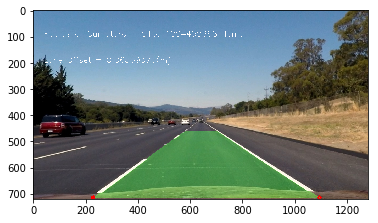

laneCenter 661.0
cameraCenter 640
curve: Radius of Curvature = 43.15746205185528(m), offset: Lane Offset = 0.060703125(m)


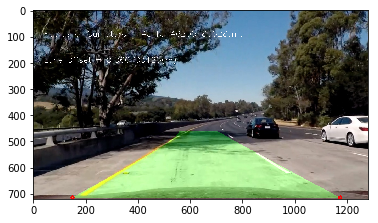

laneCenter 750.0
cameraCenter 640
curve: Radius of Curvature = 55.58736171480984(m), offset: Lane Offset = 0.31796875(m)


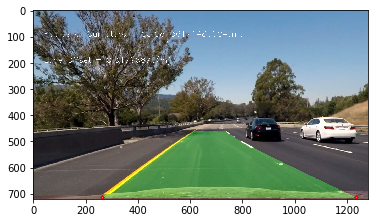

laneCenter 655.0
cameraCenter 640
curve: Radius of Curvature = 638.9155197666479(m), offset: Lane Offset = 0.043359375(m)


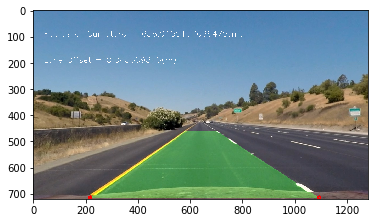

laneCenter 858.0
cameraCenter 640
curve: Radius of Curvature = 209.5898341431468(m), offset: Lane Offset = 0.63015625(m)


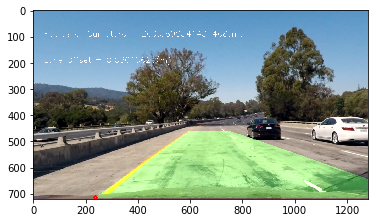

laneCenter 739.0
cameraCenter 640
curve: Radius of Curvature = 64.58718907457617(m), offset: Lane Offset = 0.286171875(m)


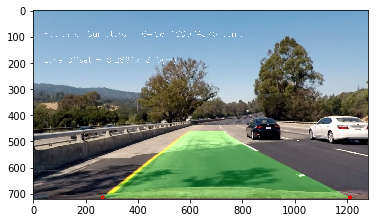

laneCenter 749.0
cameraCenter 640
curve: Radius of Curvature = 90.0597186932258(m), offset: Lane Offset = 0.315078125(m)


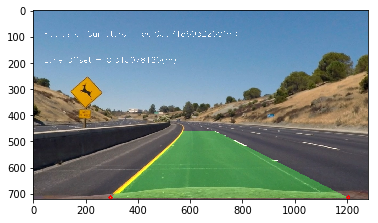

laneCenter 688.0
cameraCenter 640
curve: Radius of Curvature = 118.2144125443469(m), offset: Lane Offset = 0.13874999999999998(m)


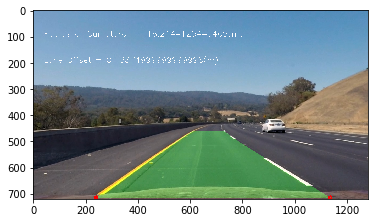

In [39]:
TEST_DIR = glob.glob("../test_images/*.jpg")
for img_link in TEST_DIR:    
    img = cv2.cvtColor(cv2.imread(img_link), cv2.COLOR_BGR2RGB)
    out_img = full_pipeline(img)
    plt.imshow(out_img)
    plt.show()

# 6. Entire Pipeline on Video

In [40]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixel
        self.allx = None  
        #y values for detected line pixels
        self.ally = None  
        #number to track
        self.num_kept = 30
        self.ploty = None
        
def updateLines(res, left_line, right_line):
    """
    Updates the values of left and right line with the res
    """
    if res['detected'] == True:
        #left line update
        left_line.detected = True
        left_line.recent_xfitted.append(res['left_fitx'])
        if len(left_line.recent_xfitted) > left_line.num_kept:
            left_line.recent_xfitted.pop(0)
        left_line.bestx = np.mean(left_line.recent_xfitted, axis=0)
        left_line.current_fit = res['left_fit']
        left_line.radius_of_curvature = res['left_curverad']
        
         #right line update
        right_line.detected = True
        right_line.recent_xfitted.append(res['right_fitx'])
        if len(right_line.recent_xfitted) > right_line.num_kept:
            right_line.recent_xfitted.pop(0)
        right_line.bestx = np.mean(right_line.recent_xfitted, axis=0)
        right_line.current_fit = res['right_fit']
        right_line.radius_of_curvature = res['right_curverad']        
        
# TODO: FIX THIS
def sanityCheck(res, left_line, right_line):
    """
    What are some sanity checks to implement? 
    """
    diff_left = np.sum(np.abs(left_line.current_fit - res['left_fit']))
    diff_right = np.sum(np.abs(right_line.current_fit - res['right_fit']))
    print("*******************************************")
    print("left_fit: {}, right_fit: {}".format(res['left_fit'], res['right_fit']))
    print('diff_left: {}, diff_right: {}'.format(diff_left, diff_right))
    print("*******************************************")
    
    if diff_left + diff_right > 300:
        return False

    
    return True

In [43]:
def process_video(in_file, out_file):
    TEST_DIR = glob.glob("../test_images/*.jpg")
    # camera calibration
    f = open("../camera_cal/calibration.pkl", 'rb')
    ret, mtx, dist, rvecs, tvecs = pickle.load(f)
    f.close()
    #line ine
    left_line, right_line = Line(), Line()

    #cv2 configs
    test_img = cv2.imread(TEST_DIR[0])
    img_size = (test_img.shape[1], test_img.shape[0])
    ploty =   np.linspace(0, img_size[1]-1, img_size[1])
    cap = cv2.VideoCapture(in_file)
    fourcc = cv2.VideoWriter_fourcc(*'XVID')
    out = cv2.VideoWriter(out_file,fourcc, 30.0, img_size)
    i = 0
    M, Minv = None, None
    num_lost_in_row = sys.maxsize
    NUM_LOST_TO_RESET = 5

    while i < 50:
        # Calculate the matrix
        if i == 0:
            M, Minv = getStaticTransformationMatrix(img)        
        # Capture frame by frame
        ret, frame = cap.read()
        #Convert to rgb
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        
        # Undistort
        undistorted = cv2.undistort(frame, mtx, dist, None, mtx)                
        
        #Trasnfrom to birdsEye 
        birdsEyeView = cv2.warpPerspective(undistorted, M, img_size)
        birdsEyeBinary = pipeline_binary(birdsEyeView).astype(np.uint8)
        if ret == True:
            # process the frame
            res = None
            if num_lost_in_row >= NUM_LOST_TO_RESET:
                # run histogram
                print("FIT POLYNOMIAL")
                res = fit_polynomial_with_curvature(birdsEyeBinary)
                updateLines(res, left_line, right_line)
                num_lost_in_row = 0
            else:
                print("SEARCH POLYNOMIAL")
                left_fit, right_fit = left_line.current_fit, right_line.current_fit
                res = search_around_poly_with_curvature(birdsEyeBinary, left_fit, right_fit) 
                
                if sanityCheck(res, left_line, right_line):
                    #Update Lines 
                    updateLines(res, left_line, right_line)
                    num_lost_in_row = 0
                else:
                    num_lost_in_row += 1
        else:
            break
                        
        # Extract the variables which draw regardless of whatever happens
        left_fitx, right_fitx = left_line.bestx, right_line.bestx
        left_curverad, right_curverad = left_line.radius_of_curvature, right_line.radius_of_curvature
        print('num kept points', len(left_line.recent_xfitted))

        #warped
        color_warp = np.zeros_like(frame).astype(np.uint8)
        pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
        pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
        pts = np.hstack((pts_left, pts_right))
        # Draw the lane onto the warped blank image
        cv2.fillPoly(color_warp, np.array([pts], 'int32'), (0,255, 0))

        # Warp the blank back to original image space using inverse perspective matrix (Minv)
        newwarp = cv2.warpPerspective(color_warp, Minv, img_size) 
        # Combine the result with the original image
        result = cv2.addWeighted(frame, 1, newwarp, 0.3, 0)

        # Write the curverad 
        avg_radius = min(left_curverad , right_curverad)
        font = cv2.FONT_HERSHEY_SIMPLEX
        txt = 'Radius of Curvature = {}(m)'.format(avg_radius)
        cv2.putText(result, txt, (40, 100), font, 1, (255, 255, 255))

        # get the left and right point of y = image_size[0]
        endPoints = np.array([pts_left[0][-1], pts_right[0][0]], dtype=np.float32)
        endPointsTransformed = cv2.perspectiveTransform(np.array([endPoints]), Minv)
        leftEndPoint, rightEndPoint = endPointsTransformed[0]
        cv2.circle(result, tuple(leftEndPoint), 2, (255, 0, 0), thickness=5)
        cv2.circle(result, tuple(rightEndPoint), 2, (255, 0, 0), thickness=5)
        # Calculate the Offset
        laneCenter = (leftEndPoint[0] + rightEndPoint[0]) // 2
        cameraCenter = img_size[0] // 2
        xm_per_pix = 3.7/img_size[0] # meters per pixel in x dimension
        offset = np.abs(laneCenter - cameraCenter) * xm_per_pix
        offset_txt = 'Lane Offset = {}(m)'.format(offset)
        cv2.putText(result, offset_txt, (40, 200), font, 1, (255, 255, 255))

        result = cv2.cvtColor(result, cv2.COLOR_RGB2BGR)
        out.write(result)      

        i +=1
    cap.release()
    cv2.destroyAllWindows()

In [44]:
np.set_printoptions(suppress=True)
project_output = '../test_videos_output/project_video.mp4'
project_input = '../project_video.mp4'
process_video(project_input, project_output)
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output))

FIT POLYNOMIAL
num kept points 1
SEARCH POLYNOMIAL
*******************************************
left_fit: [ -0.00025404   0.36781211 241.85794134], right_fit: [  0.00010309  -0.00275188 981.07718978]
diff_left: 0.19269194321872696, diff_right: 5.557766925797699
*******************************************
num kept points 2
SEARCH POLYNOMIAL
*******************************************
left_fit: [ -0.00026033   0.37569833 240.15917061], right_fit: [ -0.00002362   0.11488949 953.87258899]
diff_left: 1.706663250650107, diff_right: 27.322368868326986
*******************************************
num kept points 3
SEARCH POLYNOMIAL
*******************************************
left_fit: [ -0.00027456   0.3918004  236.57143692], right_fit: [ -0.00008025   0.16469126 942.06726723]
diff_left: 3.6038499805700153, diff_right: 11.855180152584557
*******************************************
num kept points 4
SEARCH POLYNOMIAL
*******************************************
left_fit: [ -0.00025739   0.38309374

SEARCH POLYNOMIAL
*******************************************
left_fit: [ -0.00024391   0.38008945 216.12877066], right_fit: [ -0.00018046   0.27097557 908.36157815]
diff_left: 4.309579351880848, diff_right: 19.67121749325604
*******************************************
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [ -0.00027196   0.39747041 217.74466332], right_fit: [ -0.00014653   0.26613705 898.22757783]
diff_left: 1.6333016737793664, diff_right: 10.138872778546277
*******************************************
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [ -0.00026189   0.39355968 215.77155192], right_fit: [ -0.00003872   0.19004931 915.18102087]
diff_left: 1.9770321997801557, diff_right: 17.029638589850286
*******************************************
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [ -0.000278     0.40548775 216.23444038], right_fit: [  0

In [17]:
challenge_output = '../test_videos_output/challenge_video.mp4'
challenge_input = '../challenge_video.mp4'
process_video(challenge_input, challenge_output)
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_output))

FIT POLYNOMIAL
num kept points 1
SEARCH POLYNOMIAL
*******************************************
left_fit: [ -0.00013367  -0.23385778 610.48274379], right_fit: [   0.00152815   -1.83664666 1500.74664253]
diff_left: 91.94046564305292, diff_right: 218.33033992259016
*******************************************
num kept points 1
SEARCH POLYNOMIAL
*******************************************
left_fit: [ -0.0008513    0.6850919  318.57993772], right_fit: [   0.00087915   -1.09130258 1288.76944821]
diff_left: 384.76293902967757, diff_right: 5.607190334066987
*******************************************
num kept points 1
SEARCH POLYNOMIAL
*******************************************
left_fit: [ -0.00075563   0.57912487 346.20802298], right_fit: [   0.00101513   -1.26798699 1347.30443012]
diff_left: 357.02879107121265, diff_right: 64.31895481464318
*******************************************
num kept points 1
SEARCH POLYNOMIAL
*******************************************
left_fit: [ -0.00056228   0.3

SEARCH POLYNOMIAL
*******************************************
left_fit: [   0.00222371   -3.3637585  1651.43386928], right_fit: [ -0.00286688   3.47767474 -58.66472132]
diff_left: 643.7239919910394, diff_right: 852.5875264312688
*******************************************
num kept points 10
FIT POLYNOMIAL
num kept points 11
SEARCH POLYNOMIAL
*******************************************
left_fit: [   0.00217094   -3.21798105 1577.85377594], right_fit: [   -0.00642466     8.36301719 -1710.87384004]
diff_left: 163.79481003887025, diff_right: 978.3181218192328
*******************************************
num kept points 11
SEARCH POLYNOMIAL
*******************************************
left_fit: [   0.00187688   -2.83729724 1457.1929767 ], right_fit: [  -0.00322798    4.44914592 -525.50484506]
diff_left: 284.8365871402488, diff_right: 210.9679411215689
*******************************************
num kept points 11
SEARCH POLYNOMIAL
*******************************************
left_fit: [ -0.000

SEARCH POLYNOMIAL
*******************************************
left_fit: [   0.00369205   -4.37708715 1607.77856643], right_fit: [ -0.00132932   1.71663671 526.84296662]
diff_left: 463.5229700329947, diff_right: 279.71575538471603
*******************************************
num kept points 17
FIT POLYNOMIAL
num kept points 18
SEARCH POLYNOMIAL
*******************************************
left_fit: [   0.00413761   -4.93926481 1784.16635335], right_fit: [ -0.00162035   1.4355042  830.51148453]
diff_left: 137.05155767046497, diff_right: 126.09844566809814
*******************************************
num kept points 19
SEARCH POLYNOMIAL
*******************************************
left_fit: [   0.0037742    -4.65111703 1746.16463971], right_fit: [ -0.00171916   1.64172927 752.5420788 ]
diff_left: 38.290224836790316, diff_right: 78.17572961500608
*******************************************
num kept points 20
SEARCH POLYNOMIAL
*******************************************
left_fit: [   0.00392006

SEARCH POLYNOMIAL
*******************************************
left_fit: [  0.00120478  -1.72574154 984.22073349], right_fit: [   0.00002164    0.21649577 1005.20119804]
diff_left: 387.89317200740453, diff_right: 112.0190055989671
*******************************************
num kept points 27
SEARCH POLYNOMIAL
*******************************************
left_fit: [  0.00122958  -1.7195577  975.65795352], right_fit: [ -0.00023089   0.44965702 963.52210031]
diff_left: 396.4621110240035, diff_right: 153.93145485559162
*******************************************
num kept points 27
SEARCH POLYNOMIAL
*******************************************
left_fit: [  0.00119483  -1.63950196 943.74198097], right_fit: [ -0.00010649   0.3123179  999.99402322]
diff_left: 428.45817406708824, diff_right: 117.3220684335555
*******************************************
num kept points 27
FIT POLYNOMIAL
num kept points 28
SEARCH POLYNOMIAL
*******************************************
left_fit: [  0.00096543  -1.341

SEARCH POLYNOMIAL
*******************************************
left_fit: [   0.00155328   -2.85182973 1605.88722055], right_fit: [   0.00145858   -1.96558072 1581.59932918]
diff_left: 420.849818653033, diff_right: 476.5451915930725
*******************************************
num kept points 30
FIT POLYNOMIAL
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [  0.00047204  -0.73894912 515.87039826], right_fit: [   0.00051113   -0.89475601 1284.98622616]
diff_left: 88.00548166925985, diff_right: 437.51632593960386
*******************************************
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [  0.00023525  -0.47937943 444.35603019], right_fit: [   0.00156359   -2.19466342 1684.40449652]
diff_left: 16.231307121217334, diff_right: 36.79709572306961
*******************************************
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [  0.00022014 

SEARCH POLYNOMIAL
*******************************************
left_fit: [ -0.00083955   0.55948682 381.26275701], right_fit: [   0.00075196   -0.933707   1216.7276988 ]
diff_left: 96.76060349923362, diff_right: 1.6312615595833226
*******************************************
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [ -0.00090959   0.66013    345.92815953], right_fit: [   0.00153067   -1.61725082 1360.58835639]
diff_left: 35.43531070485039, diff_right: 144.54498012110963
*******************************************
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [ -0.00113189   0.9159479  274.49950653], right_fit: [   0.00174366   -1.8138698  1398.60823018]
diff_left: 71.68469319797732, diff_right: 38.21670574228028
*******************************************
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [ -0.00118111   0.99778616 242.52931449], right_fi

FIT POLYNOMIAL
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [  -0.00253435    2.82244653 -364.31740357], right_fit: [  -0.00369643    4.13060792 -439.95630525]
diff_left: 393.50174449349777, diff_right: 575.9211376236935
*******************************************
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [  -0.00229634    2.56221697 -294.22033833], right_fit: [  -0.00316994    3.48104287 -242.01102601]
diff_left: 323.14421168422336, diff_right: 377.32576683341534
*******************************************
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [  -0.00233005    2.63586514 -327.88123446], right_fit: [ -0.0013008    1.16109821 467.01912607]
diff_left: 356.87878969602093, diff_right: 334.02619904082337
*******************************************
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [  -0.0

SEARCH POLYNOMIAL
*******************************************
left_fit: [  -0.00300257    3.63728028 -708.58605043], right_fit: [   0.00075095   -0.93986801 1206.20506399]
diff_left: 576.9663255832934, diff_right: 150.58539459714294
*******************************************
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [  -0.00240957    2.73369229 -373.45657982], right_fit: [   0.00258488   -2.80158093 1659.85641628]
diff_left: 240.93267397526634, diff_right: 304.9295045431875
*******************************************
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [-0.00132487  1.35281194 62.9124074 ], right_fit: [   0.00214364   -2.34910518 1548.04254806]
diff_left: 196.8182782916496, diff_right: 192.66271932808863
*******************************************
num kept points 30
FIT POLYNOMIAL
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [ -0.0011026

SEARCH POLYNOMIAL
*******************************************
left_fit: [   -0.00512927     6.14547622 -1431.38762142], right_fit: [   0.00058443   -0.79092729 1179.92776888]
diff_left: 1261.7911275061388, diff_right: 36.25451974797186
*******************************************
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [   -0.00508487     6.24014995 -1511.5517254 ], right_fit: [   0.00058022   -0.7863882  1181.35412505]
diff_left: 1342.0498608096643, diff_right: 34.83270687596826
*******************************************
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [  0.00039379  -0.83574495 764.07244983], right_fit: [   0.00079376   -0.99483484 1233.22561108]
diff_left: 940.655687978749, diff_right: 17.24743932201801
*******************************************
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [ -0.00171048   1.79837107 -57.41450212

SEARCH POLYNOMIAL
*******************************************
left_fit: [  0.00079089  -1.19010482 821.11938938], right_fit: [   0.0008579    -1.0007761  1203.49774926]
diff_left: 47.70181615016624, diff_right: 46.467396928486636
*******************************************
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [  0.00055819  -0.90569924 732.16063559], right_fit: [   0.00078935   -0.9514458  1197.34401871]
diff_left: 89.2433920793406, diff_right: 6.203129391335771
*******************************************
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [  0.00015511  -0.41494746 584.09845634], right_fit: [   0.00175517   -1.83521491 1389.16238151]
diff_left: 148.5533341009215, diff_right: 192.70309772218874
*******************************************
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [ -0.00015389  -0.03518947 467.99553938], right_fit

SEARCH POLYNOMIAL
*******************************************
left_fit: [   -0.00489707     6.03121109 -1461.04266863], right_fit: [   0.00138284   -1.53713399 1332.55411146]
diff_left: 1828.6644591142476, diff_right: 170.17901405421173
*******************************************
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [  -0.00173324    1.94363855 -147.99512122], right_fit: [   0.00096623   -1.14310428 1243.27114564]
diff_left: 511.52617533103586, diff_right: 80.50160190399059
*******************************************
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [ -0.00050667   0.31099563 394.35817964], right_fit: [   0.00065651   -0.85746596 1177.62598365]
diff_left: 32.461158230312456, diff_right: 14.570570272684904
*******************************************
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [ -0.00074549   0.5559703  334.5943132

SEARCH POLYNOMIAL
*******************************************
left_fit: [  -0.0028952     3.13588211 -429.99104923], right_fit: [   0.00053435   -0.57099613 1054.79248448]
diff_left: 199.27308576921237, diff_right: 106.66116878198495
*******************************************
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [   -0.00453726     5.29956079 -1138.23037924], right_fit: [   0.0012258    -1.27977361 1225.25380041]
diff_left: 909.6777365250748, diff_right: 64.50961606862946
*******************************************
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [   -0.00420969     4.93823901 -1041.1240007 ], right_fit: [   0.0011235    -1.17579696 1196.26393443]
diff_left: 812.2097086360463, diff_right: 35.41567113307034
*******************************************
num kept points 30
FIT POLYNOMIAL
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [

SEARCH POLYNOMIAL
*******************************************
left_fit: [  -0.00326608    4.00204119 -838.39654266], right_fit: [   0.00046967   -0.48361008 1016.68571977]
diff_left: 1169.7544831111484, diff_right: 4.071202745798328
*******************************************
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [  -0.00241823    2.94936129 -514.50230914], right_fit: [   0.00051121   -0.52924314 1026.67346593]
diff_left: 844.8067218303889, diff_right: 14.10462348936142
*******************************************
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [  -0.00304208    3.74220287 -769.44315984], right_fit: [   0.00106568   -1.13818165 1191.04562964]
diff_left: 1100.541037967872, diff_right: 179.086280186997
*******************************************
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [  0.00019979  -0.55496006 649.5829027 ], r

SEARCH POLYNOMIAL
*******************************************
left_fit: [  -0.00344184    4.08952345 -817.94187303], right_fit: [   0.00329933   -3.26290629 1697.22114621]
diff_left: 315.83858834117154, diff_right: 287.0476767546052
*******************************************
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [ -0.00138127   1.3365428  100.10456651], right_fit: [   0.00340415   -3.40539923 1742.59331493]
diff_left: 1236.6400691102206, diff_right: 332.5624432331142
*******************************************
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [   -0.00501036     6.10142363 -1455.92131495], right_fit: [   0.00386043   -3.97838142 1915.2824271 ]
diff_left: 324.1543222790952, diff_right: 505.8249938726992
*******************************************
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [   -0.0051086      6.30998857 -1547.9596

SEARCH POLYNOMIAL
*******************************************
left_fit: [ -0.00083261   0.65654245 321.76461363], right_fit: [   0.01176948  -17.4854782  7536.45883233]
diff_left: 357.81628866489615, diff_right: 2087.1522006252794
*******************************************
num kept points 30
FIT POLYNOMIAL
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [  -0.00319316    3.81386195 -721.67402645], right_fit: [   0.01224069  -18.05919216 7703.96876806]
diff_left: 1011.260435708863, diff_right: 2340.3812117834304
*******************************************
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [  -0.00180516    2.07946128 -180.91563811], right_fit: [   0.01268723  -18.57840942 7847.77620285]
diff_left: 468.76625868883673, diff_right: 2196.0541131866385
*******************************************
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [  -0.0

SEARCH POLYNOMIAL
*******************************************
left_fit: [  0.00016058  -0.44397194 627.40619045], right_fit: [   0.01412785  -19.41660564 7753.65421543]
diff_left: 185.70787829723142, diff_right: 705.0846884738808
*******************************************
num kept points 30
SEARCH POLYNOMIAL
*******************************************
left_fit: [ -0.00050757   0.38304156 371.14014513], right_fit: [   0.01420901  -19.51905337 7785.35266105]
diff_left: 71.38584867489708, diff_right: 673.2837139669607
*******************************************
num kept points 30


error: OpenCV(3.4.5) /io/opencv/modules/imgproc/src/color.cpp:181: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'


# 1. Test the Pipeline on the Project Video

In [45]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output))

In [ ]:
project_output = '../test_videos_output/project_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("../project_video.mp4").subclip(0, 20)
project_clip = clip1.fl_image(full_pipeline) #NOTE: this function expects color images!!
%time project_clip.write_videofile(project_output, audio=False)

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output))

# Test on Challenge Video

In [ ]:
challenge_output = '../test_videos_output/challenge_video.mp4'
challenge_input = '../challenge_video.mp4'
process_video(challenge_input, challenge_output)

In [ ]:
challenge_output = '../test_videos_output/challenge_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("../challenge_video.mp4").subclip(0, 10)
challenge_clip = clip1.fl_image(full_pipeline) #NOTE: this function expects color images!!
%time challenge_clip.write_videofile(challenge_output, audio=False)

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_output))

# Test on Even Harder Challenge Video

In [ ]:
harder_challenge_output = '../test_videos_output/harder_challenge_video.mp4'
harder_challenge_input = '../harder_challenge_video.mp4'
process_video(harder_challenge_input, harder_challenge_output)

In [ ]:
harder_challenge_output = '../test_videos_output/harder_challenge_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("../harder_challenge_video.mp4").subclip(0, 10)
harder_challenge_clip = clip1.fl_image(full_pipeline) #NOTE: this function expects color images!!
%time harder_challenge_clip.write_videofile(harder_challenge_output, audio=False)

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(harder_challenge_output))